# <u><center><font color='teal'>Naturaal Language Processing NLP using CNN in TensorFlow</font></center></u> 

# <font color='teal'>Sequence Modeling nad Literature</font>

The Deep Neural Network Model in TensorFlow applied to NLP


In [1]:
import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.regularizers import Regularizer

import tensorflow.keras.utils as ku 
import numpy as np



In [2]:
# Download the file From the web
#!wget --no-check-certificate \
#    https://storage.googleapis.com/laurencemoroney-blog.appspot.com/irish-lyrics-eof.txt \
#    -O /tmp/irish-lyrics-eof.txt

# once it is downloaded load it from the hard disk 
# Notice the use of / intead of \
path = 'O:/A_DSAnalyticsbk4-15-2020/Coursera/NLP in TensorFlow/W4/irish-lyrics-eof.txt'
data = open(path).read()

In [3]:
tokenizer = Tokenizer()

# lower case for all text, then split in sentences base on line return \n
corpus = data.lower().split('\n')      
# tokenize: create a word dictionary or encode each word, for the entire 
#            text (corpus) with an integer
tokens = tokenizer.fit_on_texts(corpus)
total_words = len(tokenizer.word_index)+1

print(data)
print('\n\n')
print(corpus)
print(total_words)

Come all ye maidens young and fair
And you that are blooming in your prime
Always beware and keep your garden fair
Let no man steal away your thyme
For thyme it is a precious thing
And thyme brings all things to my mind
nlyme with all its flavours, along with all its joys
Thyme, brings all things to my mind
Once I and a bunch of thyme
i thought it never would decay
Then came a lusty sailor
Who chanced to pass my way
And stole my bunch of thyme away
The sailor gave to me a rose
A rose that never would decay
He gave it to me to keep me reminded
Of when he stole my thyme away
Sleep, my child, and peace attend thee
All through the night
Guardian angels God will send thee
Soft the drowsy hours are creeping
Hill and dale in slumber sleeping
I my loving vigil keeping
While the moon her watch is keeping
While the weary world is sleeping
Oer thy spirit gently stealing
Visions of delight revealing
Breathes a pure and holy feeling
Though I roam a minstrel lonely
My true harp shall praise sing onl

In [4]:
# Creating the Training set, it will be a Python list called input_sequences[]
input_sequences = []
n_gram_sequence = []
for index, line in enumerate(corpus):
    # sequencing: converting each sentence in list of sequence of numbers
    token_list = tokenizer.texts_to_sequences([line])[0]
            
    print('line          => ',line)
    print('token_list    => ', token_list)
    print('tokenizer.texts_to_sequences([line])[0] => ',
          tokenizer.texts_to_sequences([line])[0])
        
    # looping through each number (word) in a given sequence (sentence)
    for i in range(1, len(token_list)):
        # Creating sequences of ngrams, in other words,
        #    for each sentence, we store the first two words,
        #    then the first three words,
        #    then the first four words, ...so on
        n_gram_sequence = token_list[:i+1]
        input_sequences.append(n_gram_sequence)
        print('input_sequences => ',input_sequences)
        
    print('\n ****** Next Line **** \n')    
    #if index==1: break



line          =>  come all ye maidens young and fair
token_list    =>  [51, 12, 96, 1217, 48, 2, 69]
tokenizer.texts_to_sequences([line])[0] =>  [51, 12, 96, 1217, 48, 2, 69]
input_sequences =>  [[51, 12]]
input_sequences =>  [[51, 12], [51, 12, 96]]
input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217]]
input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48]]
input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2]]
input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69]]

 ****** Next Line **** 

line          =>  and you that are blooming in your prime
token_list    =>  [2, 11, 15, 31, 361, 8, 24, 1218]
tokenizer.texts_to_sequences([line])[0] =>  [2, 11, 15, 31, 361, 8, 24, 1218]
input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [5

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 17, 12, 75, 1220, 236

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 17, 12, 75, 1220, 236

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




input_sequences =>  [[51, 12], [51, 12, 96], [51, 12, 96, 1217], [51, 12, 96, 1217, 48], [51, 12, 96, 1217, 48, 2], [51, 12, 96, 1217, 48, 2, 69], [2, 11], [2, 11, 15], [2, 11, 15, 31], [2, 11, 15, 31, 361], [2, 11, 15, 31, 361, 8], [2, 11, 15, 31, 361, 8, 24], [2, 11, 15, 31, 361, 8, 24, 1218], [272, 798], [272, 798, 2], [272, 798, 2, 204], [272, 798, 2, 204, 24], [272, 798, 2, 204, 24, 579], [272, 798, 2, 204, 24, 579, 69], [118, 35], [118, 35, 119], [118, 35, 119, 799], [118, 35, 119, 799, 56], [118, 35, 119, 799, 56, 24], [118, 35, 119, 799, 56, 24, 184], [10, 184], [10, 184, 25], [10, 184, 25, 23], [10, 184, 25, 23, 5], [10, 184, 25, 23, 5, 580], [10, 184, 25, 23, 5, 580, 456], [2, 184], [2, 184, 800], [2, 184, 800, 12], [2, 184, 800, 12, 801], [2, 184, 800, 12, 801, 4], [2, 184, 800, 12, 801, 4, 7], [2, 184, 800, 12, 801, 4, 7, 235], [1219, 17], [1219, 17, 12], [1219, 17, 12, 75], [1219, 17, 12, 75, 1220], [1219, 17, 12, 75, 1220, 236], [1219, 17, 12, 75, 1220, 236, 17], [1219, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [5]:
# Finding the max lenght of ngrams, so we can use it for padding
max_sequence_len = max([len(x) for x in input_sequences])
print('max_sequence_len => ', max_sequence_len)

# padding the input_sequeces
input_sequences = np.array(pad_sequences(input_sequences,
                                        maxlen=max_sequence_len,
                                        padding='pre'))
print(input_sequences)

max_sequence_len =>  16
[[   0    0    0 ...    0   51   12]
 [   0    0    0 ...   51   12   96]
 [   0    0    0 ...   12   96 1217]
 ...
 [   0    0    0 ...    0   47  105]
 [   0    0    0 ...   47  105  138]
 [   0    0    0 ...  105  138  184]]


In [6]:
# Spliting the input_sequences into x's and y's
xs     = input_sequences[:,:-1]
labels = input_sequences[:,-1]

print('xs =>', xs)
print('\nlabels =>', labels)

xs => [[  0   0   0 ...   0   0  51]
 [  0   0   0 ...   0  51  12]
 [  0   0   0 ...  51  12  96]
 ...
 [  0   0   0 ...   0   0  47]
 [  0   0   0 ...   0  47 105]
 [  0   0   0 ...  47 105 138]]

labels => [  12   96 1217 ...  105  138  184]


In [7]:
# One-Hot encoding
ys = tf.keras.utils.to_categorical(labels, num_classes=total_words)

In [8]:
# NN to classify what the next world shoul be
#     LSTM >> Forward only
model = Sequential()
model.add(Embedding(total_words, 100, input_length=max_sequence_len-1))
model.add(LSTM(150)) 
model.add(Dense(total_words, activation='softmax'))  
adam = Adam(lr=0.01)
model.compile(loss='categorical_crossentropy', 
              optimizer=adam, 
              metrics=['accuracy'])
history = model.fit(xs, ys, epochs=100, verbose=1)
print(model.summary())

Train on 12038 samples
Epoch 1/100
12038/12038 [==============================] - 16s 1ms/sample - loss: 6.6485 - accuracy: 0.0731
Epoch 2/100
12038/12038 [==============================] - 16s 1ms/sample - loss: 5.8120 - accuracy: 0.1100
Epoch 3/100
12038/12038 [==============================] - 14s 1ms/sample - loss: 4.9870 - accuracy: 0.1603
Epoch 4/100
12038/12038 [==============================] - 14s 1ms/sample - loss: 4.1189 - accuracy: 0.2211
Epoch 5/100
12038/12038 [==============================] - 15s 1ms/sample - loss: 3.2960 - accuracy: 0.3153
Epoch 6/100
12038/12038 [==============================] - 14s 1ms/sample - loss: 2.6579 - accuracy: 0.4089
Epoch 7/100
12038/12038 [==============================] - 14s 1ms/sample - loss: 2.1519 - accuracy: 0.5047
Epoch 8/100
12038/12038 [==============================] - 16s 1ms/sample - loss: 1.7955 - accuracy: 0.5756
Epoch 9/100
12038/12038 [==============================] - 16s 1ms/sample - loss: 1.5085 - accuracy: 0.6391
Epoch

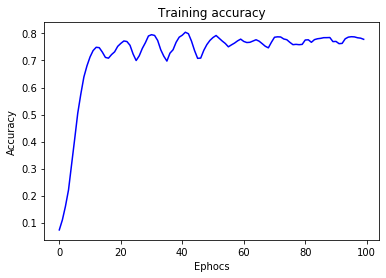

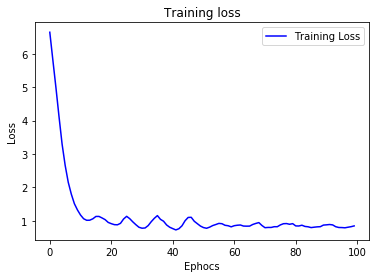

In [9]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
loss = history.history['loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training accuracy')
plt.title('Training accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Ephocs')

plt.figure()

plt.plot(epochs, loss, 'b', label='Training Loss')
plt.title('Training loss')
plt.ylabel('Loss')
plt.xlabel('Ephocs')
plt.legend()

plt.show()



In [10]:
# Predicting a word

# Let's start with a simple sentence:
seed_test  = "Lawrence went to Dublin"
next_words = 10    # we will check 10 next words

for _ in range(next_words):
    # Tokenizing the sentence
    # Notice I am using the already trained word_index dictionary
    token_list = tokenizer.texts_to_sequences([seed_test])[0]
    print('token_list => ', token_list)
    
    # padding the sequence
    token_list = pad_sequences([token_list],
                               maxlen=max_sequence_len -1,
                               padding='pre')
    
    # pass to the model to get a prediction
    predicted = model.predict_classes(token_list, verbose=0)
    output_word = ""
    
    # Doing a reverse lookup on the word index items to turn 
    #   the token back into a word and to add that to our seed texts
    for word, index in tokenizer. word_index.items():
        if index==predicted:
            output_word = word
            break

    seed_test += " " + output_word

print('seed_text + prediction => ',seed_test)

token_list =>  [173, 4, 151]
token_list =>  [173, 4, 151, 2]
token_list =>  [173, 4, 151, 2, 1066]
token_list =>  [173, 4, 151, 2, 1066, 866]
token_list =>  [173, 4, 151, 2, 1066, 866, 2]
token_list =>  [173, 4, 151, 2, 1066, 866, 2, 1986]
token_list =>  [173, 4, 151, 2, 1066, 866, 2, 1986, 30]
token_list =>  [173, 4, 151, 2, 1066, 866, 2, 1986, 30, 425]
token_list =>  [173, 4, 151, 2, 1066, 866, 2, 1986, 30, 425, 2]
token_list =>  [173, 4, 151, 2, 1066, 866, 2, 1986, 30, 425, 2, 1124]
seed_text + prediction =>  Lawrence went to Dublin and banish ghosts and goblins be here and move he
